# Actividad 2
En el siguiente apartado se va a desarrollar la Actividad 2.

In [1]:
# Importar librerias
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [2]:
# Crear clase para manejar imagenes
class Imagen:
    def __init__(self, name):
        self.name = name
        self.img = cv2.imread(name)
        self.img = cv2.cvtColor(self.img, cv2.COLOR_BGR2RGB)

    def show(self):
        print('El tamaño de la imagen es:', self.img.shape)
        plt.imshow(self.img)
        plt.show()
    def grises(self):
        gris = cv2.cvtColor(self.img, cv2.COLOR_RGB2GRAY)
        plt.imshow(gris, cmap='gray')
        plt.show()
    def hsv(self):
        hsv = cv2.cvtColor(self.img, cv2.COLOR_RGB2HSV)
        plt.imshow(hsv)
        plt.show()
    def brillo_contraste(self, alpha, beta):
        alpha = 1.5  # Contraste
        beta = 50    # Brillo
        adjusted = cv2.convertScaleAbs(self.img, alpha=alpha, beta=beta)
        plt.imshow(adjusted)
        plt.title('Imagen con Brillo y Contraste Ajustados')
        plt.show()
    def filtros(self):
        promedio = cv2.blur(self.img, (7, 7))
        gaussiano = cv2.GaussianBlur(self.img, (7, 7), 0)
        mediana = cv2.medianBlur(self.img, 7)
        bilateral = cv2.bilateralFilter(self.img, 9, 75, 75)
        fig, axs = plt.subplots(1, 4, figsize=(20, 5))
        fig.suptitle('Filtros de Suavizado', fontsize=16)
        axs[0].imshow(promedio)
        axs[0].set_title('Filtro Promedio')
        axs[1].imshow(gaussiano)
        axs[1].set_title('Filtro Gaussiano')
        axs[2].imshow(mediana)
        axs[2].set_title('Filtro Mediana')
        axs[3].imshow(bilateral)
        axs[3].set_title('Filtro Bilateral')
        plt.show()
    def transformaciones(self):
        (h, w) = self.img.shape[:2]
        
        # Redimensionar
        pequeña = cv2.resize(self.img, (int(w * 0.5), int(h * 0.5)), interpolation=cv2.INTER_AREA)
        grande = cv2.resize(self.img, (int(w * 2), int(h * 2)), interpolation=cv2.INTER_AREA)
        
        # Rotar
        centro = (w // 2, h // 2)
        M_rot = cv2.getRotationMatrix2D(centro, 45, 1.0)
        rotada = cv2.warpAffine(self.img, M_rot, (w, h))

        # Trasladar
        M_tras = np.float32([[1, 0, 100], [0, 1, 50]])
        trasladada = cv2.warpAffine(self.img, M_tras, (w, h))
        
        # Volteo
        volteada_h = cv2.flip(self.img, 1)
        volteada_v = cv2.flip(self.img, 0)

        # Mostrar resultados
        fig, axs = plt.subplots(1, 6, figsize=(20, 5))
        fig.suptitle('Parte 2: Transformaciones Geométricas', fontsize=16)
        axs[0].imshow(pequeña)
        axs[0].set_title('Redimensionada (50%)')
        axs[1].imshow(grande)
        axs[1].set_title('Redimensionada (200%)')
        axs[2].imshow(rotada)
        axs[2].set_title('Rotada 45°')
        axs[3].imshow(trasladada)
        axs[3].set_title('Trasladada')
        axs[4].imshow(volteada_h)
        axs[4].set_title('Volteo Horizontal')
        axs[5].imshow(volteada_v)
        axs[5].set_title('Volteo Vertical')
        plt.show()
    def bordes(self):
        gris = cv2.cvtColor(self.img, cv2.COLOR_RGB2GRAY)
        
    # Canny
        canny = cv2.Canny(gris, 100, 200)
        
        # Sobel
        sobel_x = cv2.Sobel(gris, cv2.CV_64F, 1, 0, ksize=5)
        sobel_y = cv2.Sobel(gris, cv2.CV_64F, 0, 1, ksize=5)
        sobel = cv2.bitwise_or(np.uint8(np.absolute(sobel_x)), np.uint8(np.absolute(sobel_y)))

        # Laplaciano
        laplaciano = cv2.Laplacian(gris, cv2.CV_64F)
        laplaciano = np.uint8(np.absolute(laplaciano))

        # Mostrar resultados
        fig, axs = plt.subplots(1, 3, figsize=(15, 5))
        fig.suptitle('Detección de Bordes', fontsize=16)
        axs[0].imshow(canny, cmap='gray')
        axs[0].set_title('Bordes con Canny')
        axs[1].imshow(sobel, cmap='gray')
        axs[1].set_title('Bordes con Sobel')
        axs[2].imshow(laplaciano, cmap='gray')
        axs[2].set_title('Bordes con Laplaciano')
        plt.show()
    def get_grises(self):
        return cv2.cvtColor(self.img, cv2.COLOR_RGB2GRAY)
    def esquinas(self):
        img = self.img
        gris = self.get_grises()
        
        imagen_harris = img.copy()
        imagen_shi = img.copy()

        # Harris
        esquinas_harris = cv2.cornerHarris(gris, 2, 3, 0.04)
        imagen_harris[esquinas_harris > 0.01 * esquinas_harris.max()] = [255, 0, 0]

        # Shi-Tomasi
        esquinas_shi = cv2.goodFeaturesToTrack(gris, maxCorners=100, qualityLevel=0.01, minDistance=10)
        if esquinas_shi is not None:
            for i in esquinas_shi:
                x, y = i.ravel()
                cv2.circle(imagen_shi, (int(x), int(y)), 5, (0, 255, 0), -1)

        # Mostrar resultados
        fig, axs = plt.subplots(1, 2, figsize=(12, 6))
        fig.suptitle('Detección de Esquinas', fontsize=16)
        axs[0].imshow(imagen_harris)
        axs[0].set_title('Esquinas con Harris')
        axs[1].imshow(imagen_shi)
        axs[1].set_title('Esquinas con Shi-Tomasi')
        plt.show()
    def formas(self):
        gris_contornos = self.get_grises()
        _, umbral = cv2.threshold(gris_contornos, 127, 255, cv2.THRESH_BINARY)
        contornos, _ = cv2.findContours(umbral, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
        
        imagen_contornos = self.img.copy()
        cv2.drawContours(imagen_contornos, contornos, -1, (0, 255, 0), 3) # Dibuja los contornos
        
        # Detección de Círculos con HoughCircles
        imagen_circulos = self.img.copy()
        gris_circulos = self.get_grises()
        # Se aplica un filtro de suavizado para mejorar la detección de círculos
        gris_circulos = cv2.medianBlur(gris_circulos, 5)
        
        # Detectar círculos
        circulos = cv2.HoughCircles(gris_circulos, cv2.HOUGH_GRADIENT, dp=1.2, minDist=100,
                                    param1=50, param2=30, minRadius=10, maxRadius=100)
        
        # Dibujar los círculos detectados
        if circulos is not None:
            circulos = np.uint16(np.around(circulos))
            for i in circulos[0, :]:
                # Círculo exterior
                cv2.circle(imagen_circulos, (i[0], i[1]), i[2], (255, 0, 0), 3)
                # Centro del círculo
                cv2.circle(imagen_circulos, (i[0], i[1]), 2, (0, 0, 255), 3)

        # Mostrar ambos resultados
        fig, axs = plt.subplots(1, 2, figsize=(15, 7))
        fig.suptitle('Detección de Formas y Círculos', fontsize=16)
        
        axs[0].imshow(imagen_contornos)
        axs[0].set_title('Contornos Generales')
        
        axs[1].imshow(imagen_circulos)
        axs[1].set_title('Círculos (HoughCircles)')
        
        plt.show()
    def segmentar_umbral(self, umbral):
        gris = cv2.cvtColor(self.img, cv2.COLOR_RGB2GRAY)
        _, binary = cv2.threshold(gris, umbral, 255, cv2.THRESH_BINARY)
        plt.imshow(binary, cmap='gray')
        plt.title(f'Imagen Segmentada con Umbral {umbral}')
        plt.show()
    def segmentar_adaptativo(self):
        gris = self.get_grises()
        
        # Umbralado adaptativo por media
        umbral_media = cv2.adaptiveThreshold(gris, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY, blockSize=11, C=2)
        
        # Umbralado adaptativo Gaussiano
        umbral_gaussiano = cv2.adaptiveThreshold(gris, 255, cv2.ADAPTIVE_THRESH_GAUSSIAN_C, cv2.THRESH_BINARY, blockSize=11, C=2)
        
        # Mostrar resultados
        fig, axs = plt.subplots(1, 2, figsize=(15, 7))
        fig.suptitle('Segmentación con Umbralado Adaptativo', fontsize=16)
        
        axs[0].imshow(umbral_media, cmap='gray')
        axs[0].set_title('Umbral Adaptativo (Media)')
        
        axs[1].imshow(umbral_gaussiano, cmap='gray')
        axs[1].set_title('Umbral Adaptativo (Gaussiano)')
        
        plt.show()
    def segmentar_hsv(self, lower_bound, upper_bound, color_name=""):
        hsv = cv2.cvtColor(self.img, cv2.COLOR_RGB2HSV)
        mask = cv2.inRange(hsv, lower_bound, upper_bound)
        result = cv2.bitwise_and(self.img, self.img, mask=mask)
        plt.imshow(result)
        plt.title(f'Imagen Segmentada en HSV ({color_name})')
        plt.show()
    def segmentar_kmeans(self, k):
        Z = self.img.reshape((-1, 3))
        Z = np.float32(Z)
        criteria = (cv2.TERM_CRITERIA_EPS + cv2.TERM_CRITERIA_MAX_ITER, 100, 0.2)
        _, labels, centers = cv2.kmeans(Z, k, None, criteria, 10, cv2.KMEANS_RANDOM_CENTERS)
        centers = np.uint8(centers)
        segmented_data = centers[labels.flatten()]
        segmented_image = segmented_data.reshape((self.img.shape))
        plt.imshow(segmented_image)
        plt.title(f'Imagen Segmentada con K-means (k={k})')
        plt.show()

# Parte 1: Operaciones Básicas

El tamaño de la imagen es: (960, 1280, 3)


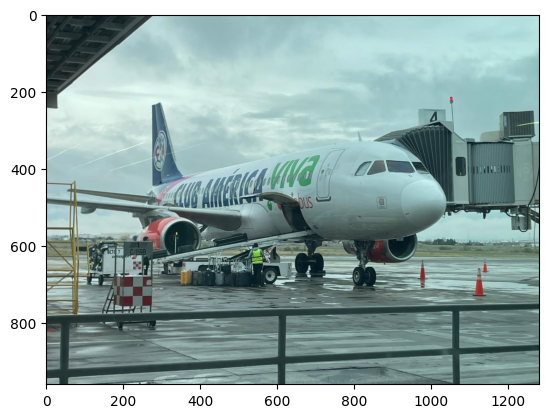

El tamaño de la imagen es: (900, 1600, 3)


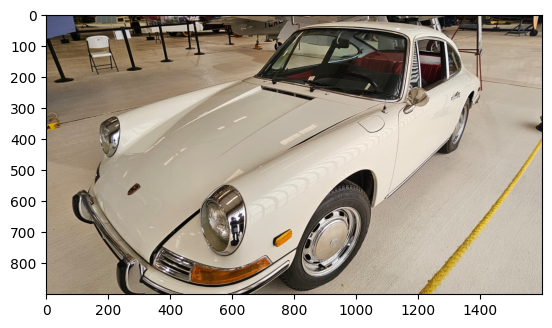

El tamaño de la imagen es: (900, 1600, 3)


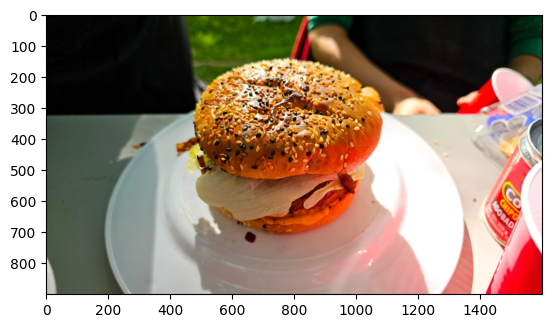

El tamaño de la imagen es: (1600, 1470, 3)


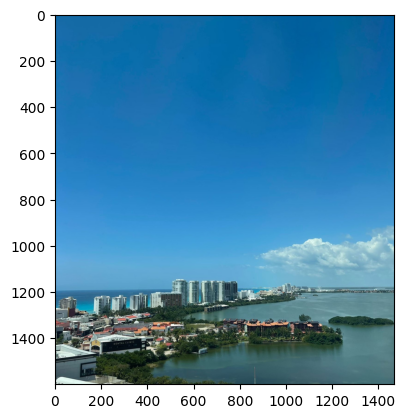

El tamaño de la imagen es: (1600, 900, 3)


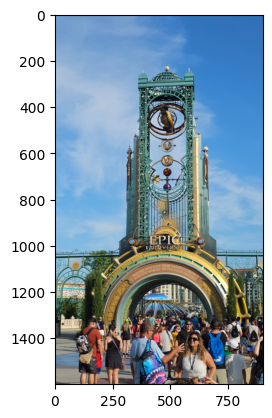

In [3]:
# Crear objetos de la clase Imagen y mostrarlas usando el metodo show    
avion = Imagen ('Avion.jpg')
avion.show()
carro = Imagen ('Carro.jpg')
carro.show()
hamburguesa = Imagen ('Hamburguesa.jpg')
hamburguesa.show()
paisaje = Imagen ('Paisaje.jpg')
paisaje.show()
universal = Imagen ('Universal.jpg')
universal.show()

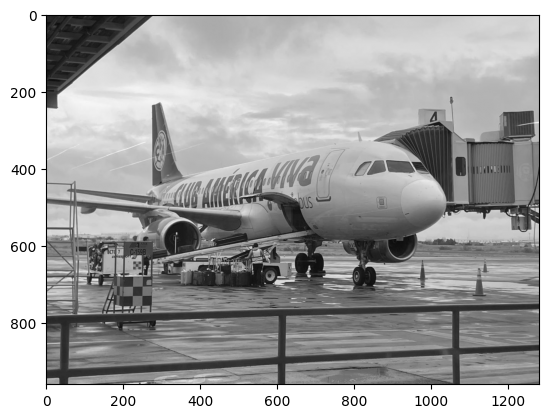

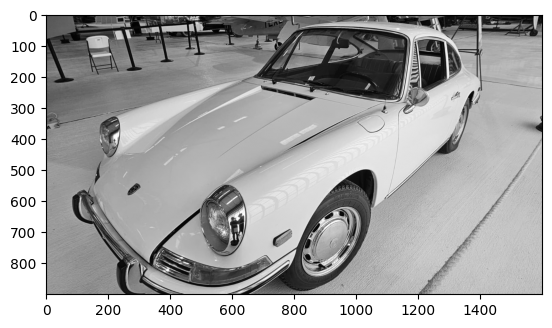

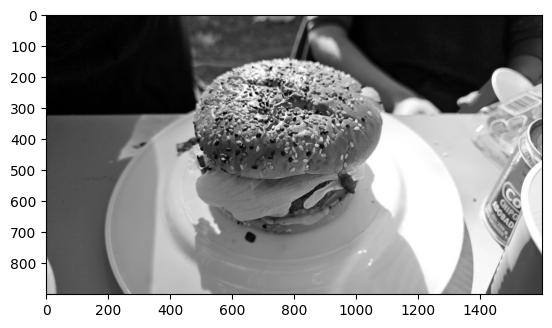

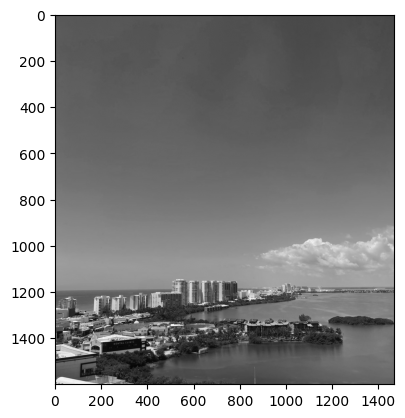

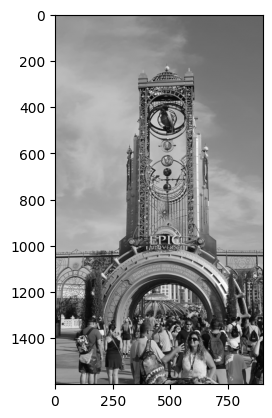

In [4]:
# Convertir las imagenes a escala de grises
avion.grises()
carro.grises()
hamburguesa.grises()
paisaje.grises()
universal.grises()

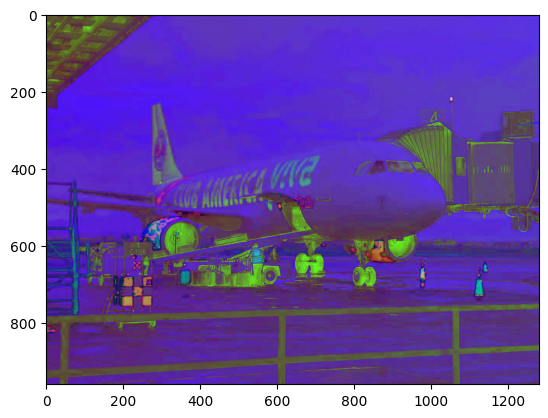

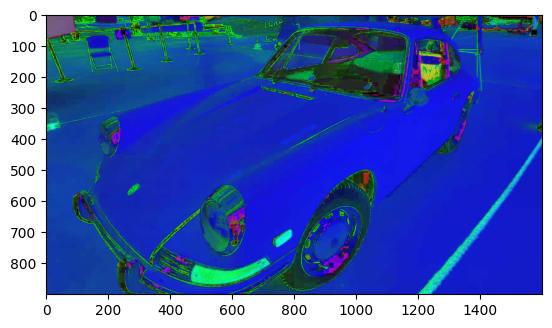

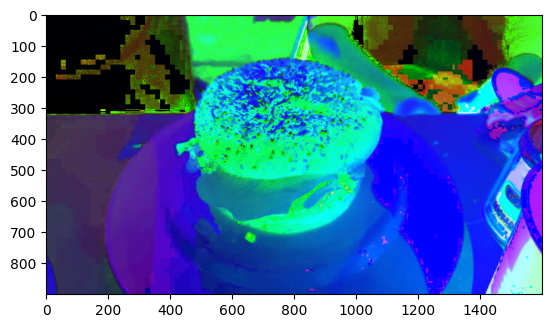

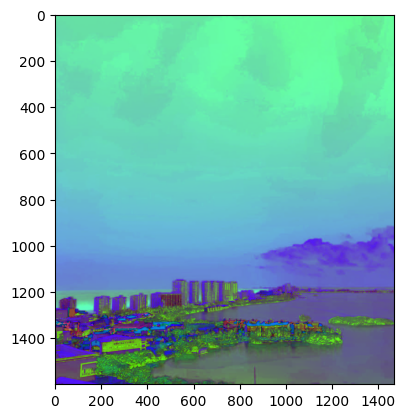

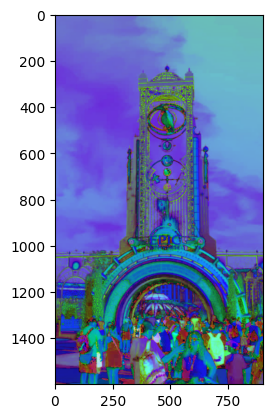

In [5]:
# Convertir las imagenes a HSV
avion.hsv()
carro.hsv()
hamburguesa.hsv()
paisaje.hsv()
universal.hsv()

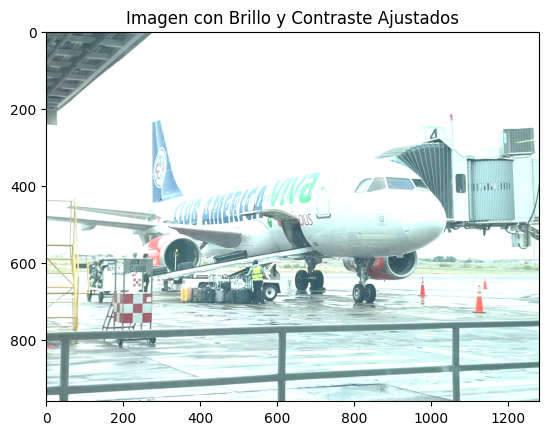

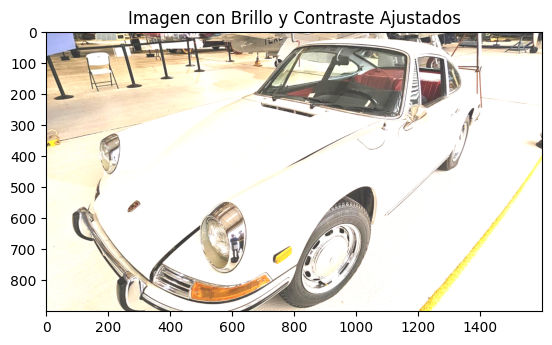

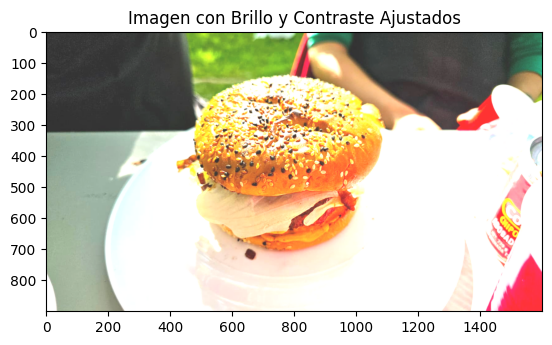

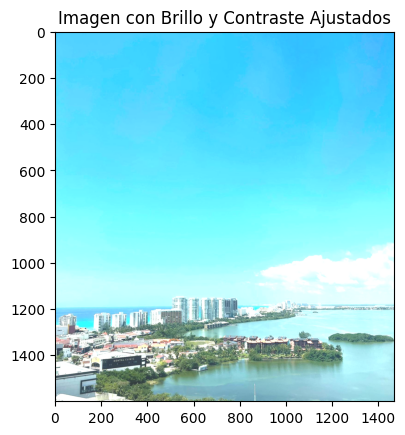

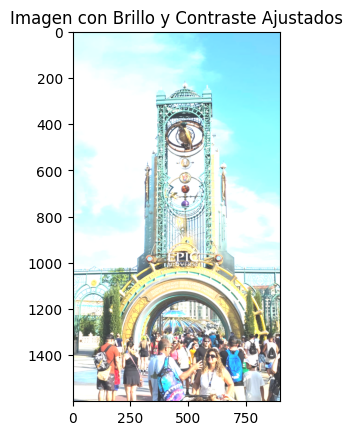

In [6]:
# Ajustar brillo y contraste de las imagenes
avion.brillo_contraste(1.5, 50)
carro.brillo_contraste(1.5, 50)
hamburguesa.brillo_contraste(1.5, 50)
paisaje.brillo_contraste(1.5, 50)
universal.brillo_contraste(1.5, 50)

# Parte 2: Filtrado y Transformaciones

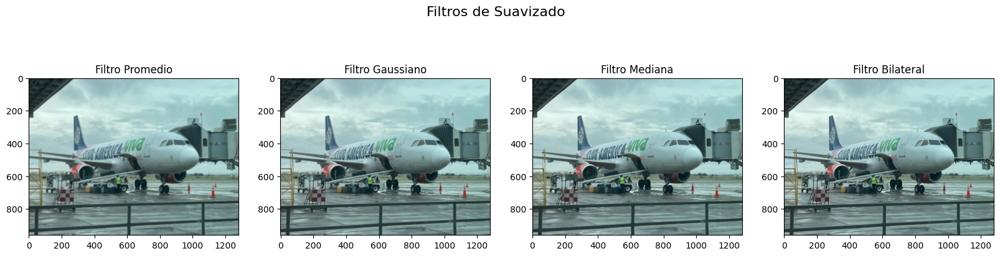

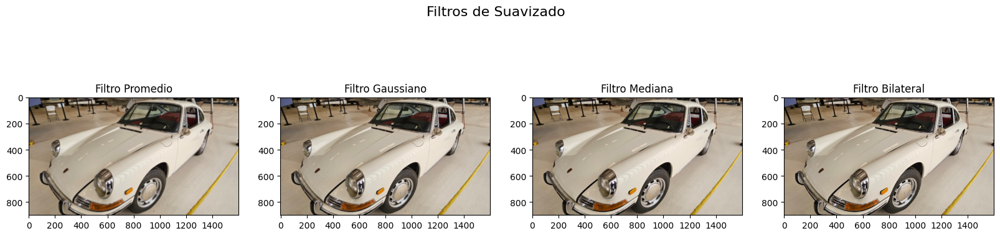

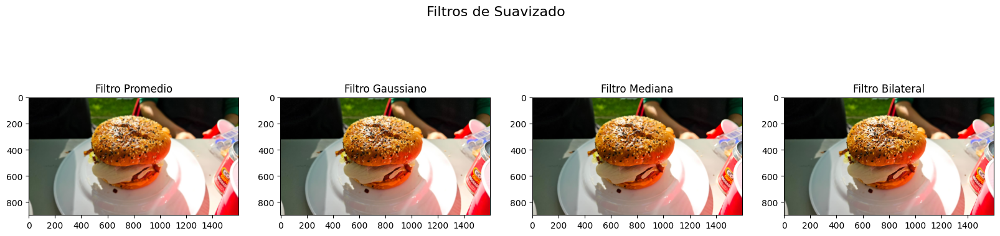

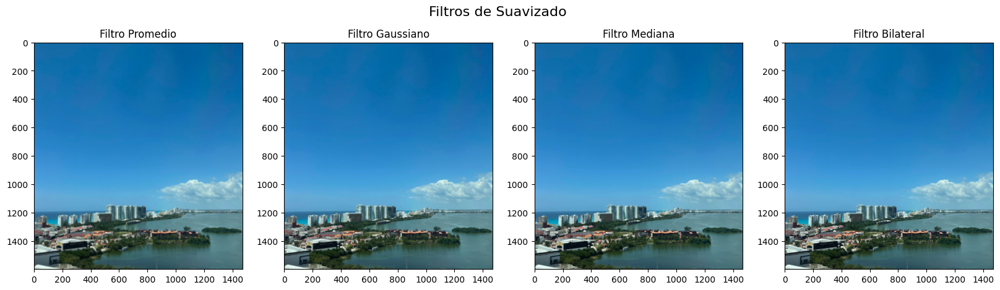

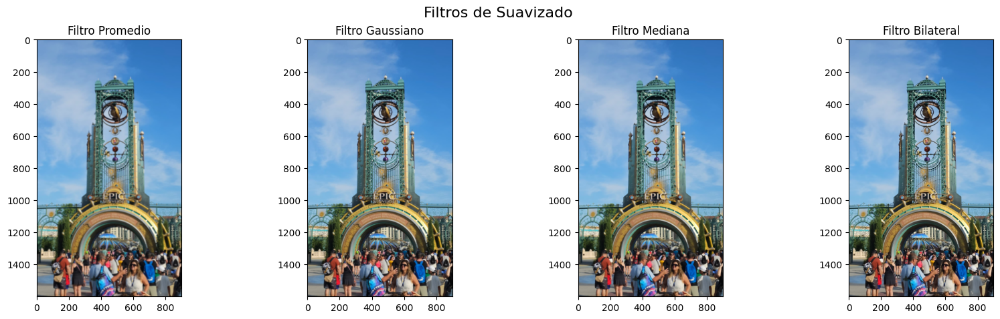

In [7]:
# Aplicar filtros de suavizado
avion.filtros()
carro.filtros()
hamburguesa.filtros()
paisaje.filtros()
universal.filtros()

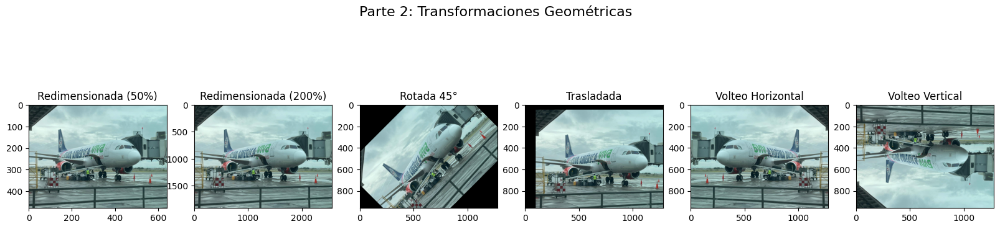

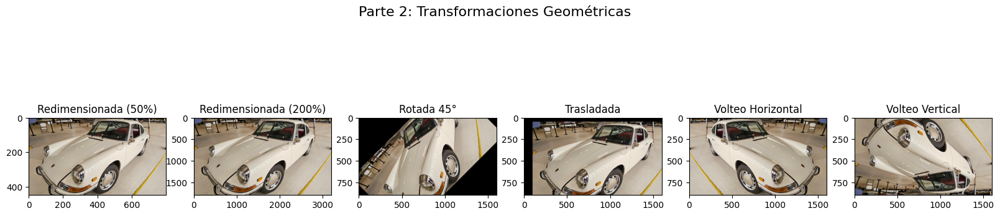

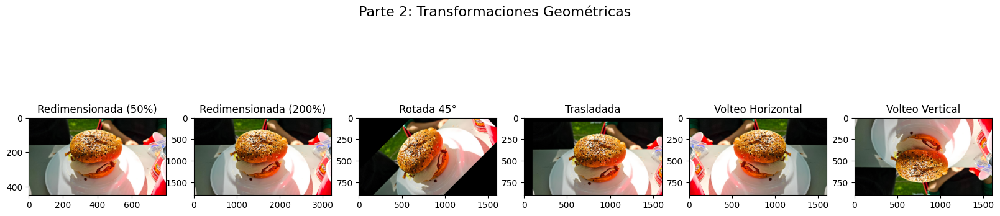

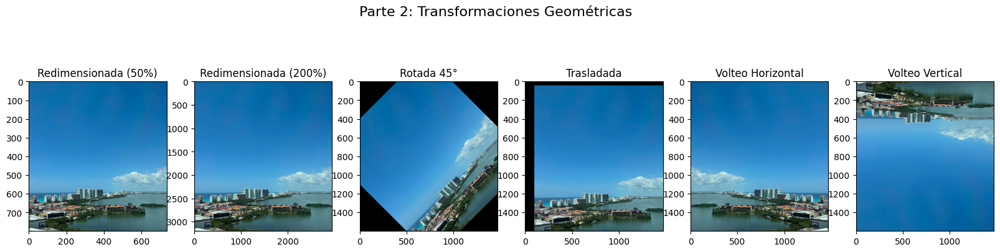

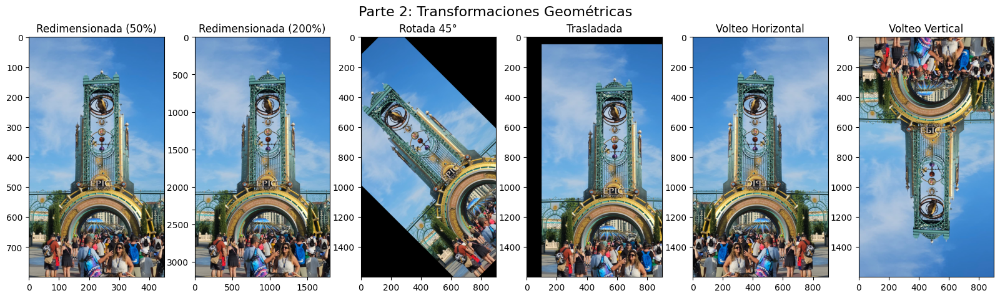

In [8]:
# Transformaciones Geometricas
avion.transformaciones()
carro.transformaciones()
hamburguesa.transformaciones()
paisaje.transformaciones()
universal.transformaciones()

# Parte 3: Análisis de Bordes y Formas

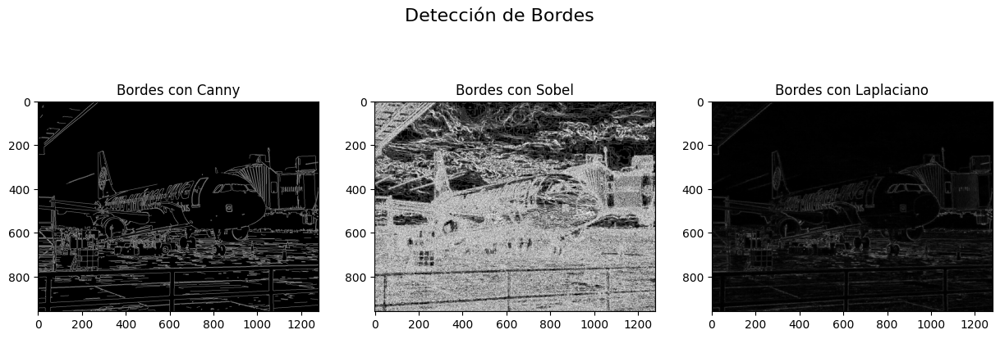

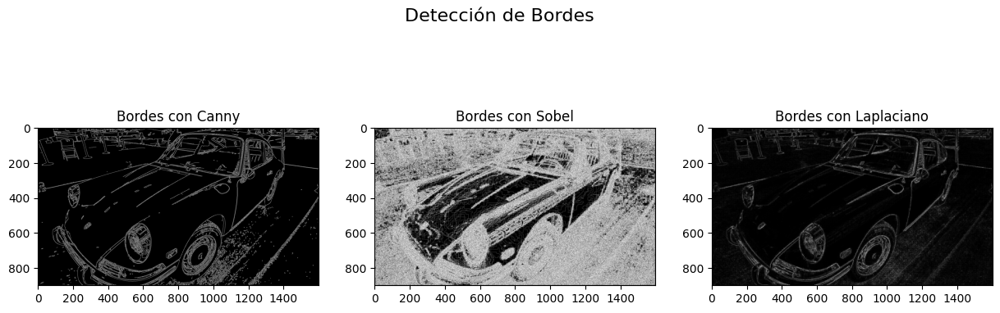

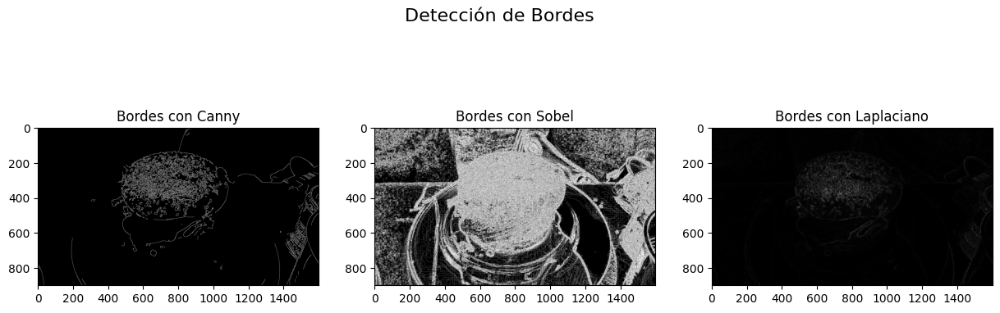

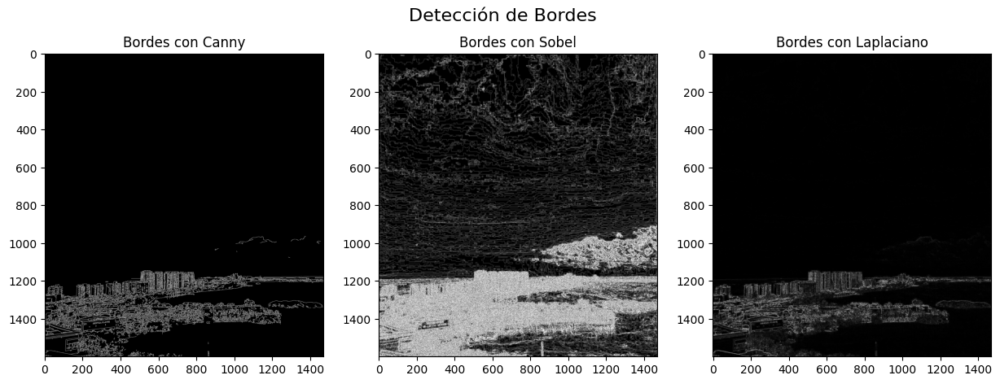

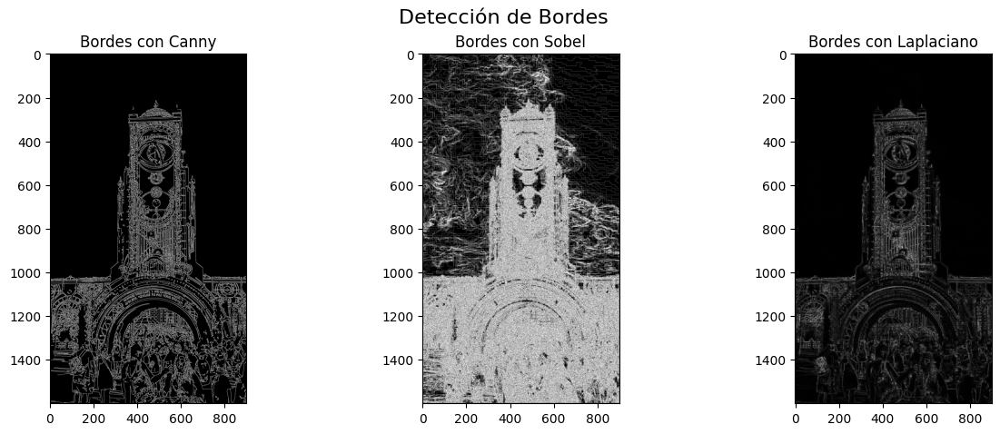

In [9]:
# Deteccion de bordes 
avion.bordes()
carro.bordes()
hamburguesa.bordes()
paisaje.bordes()
universal.bordes()

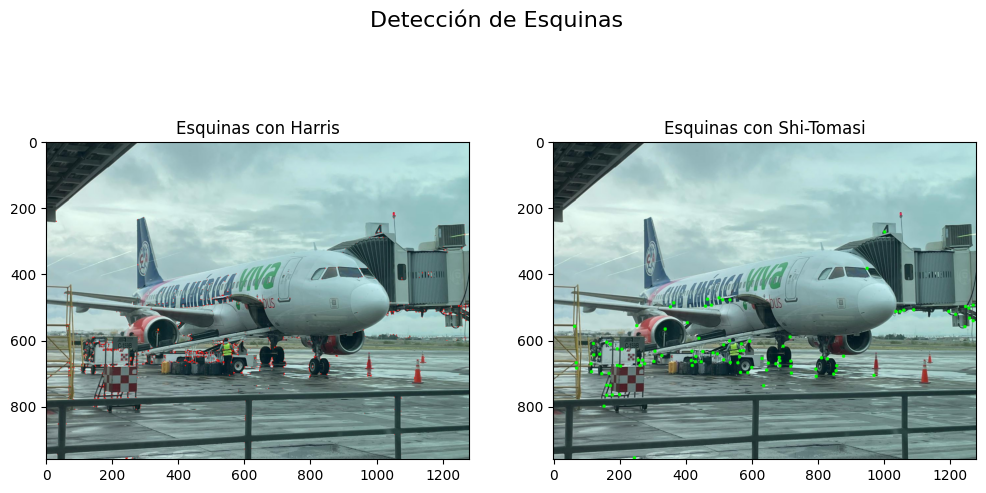

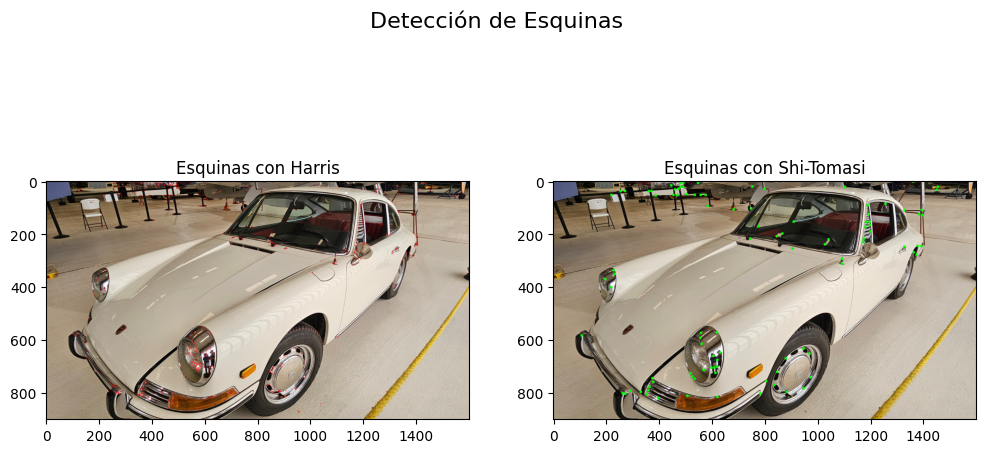

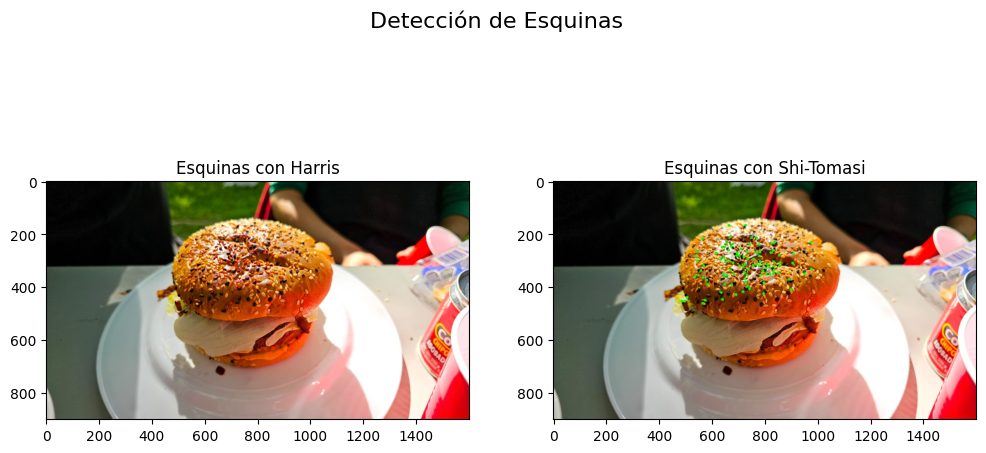

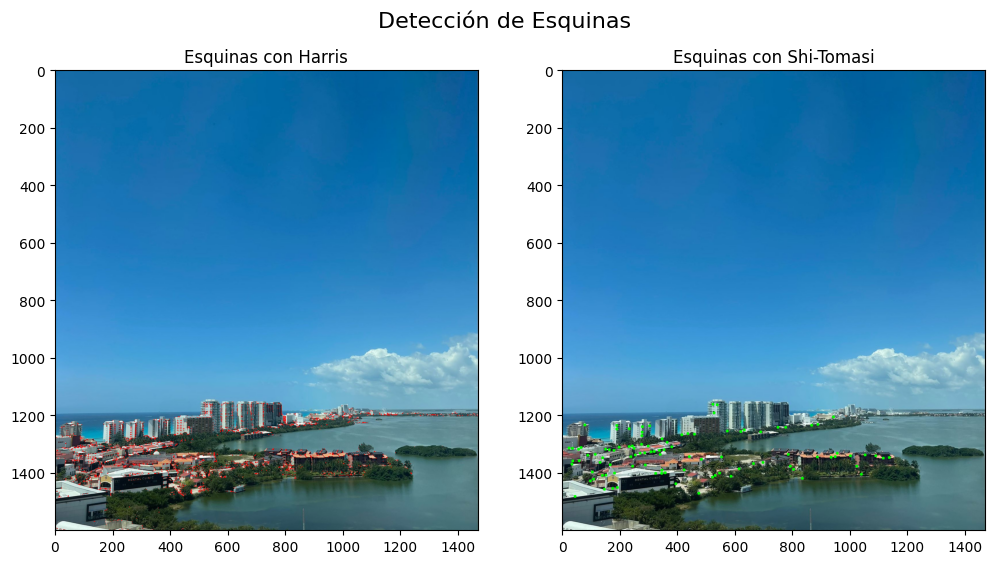

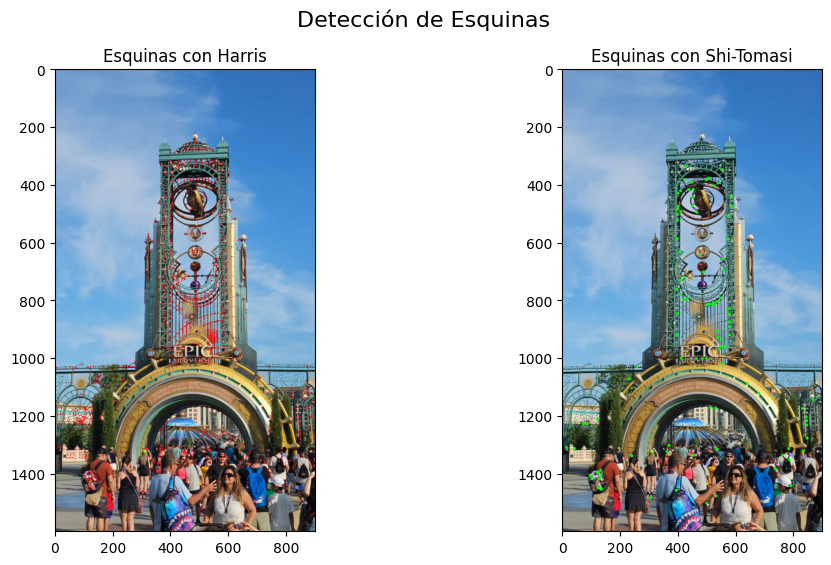

In [10]:
# Deteccion de esquinas
avion.esquinas()
carro.esquinas()
hamburguesa.esquinas()
paisaje.esquinas()
universal.esquinas()

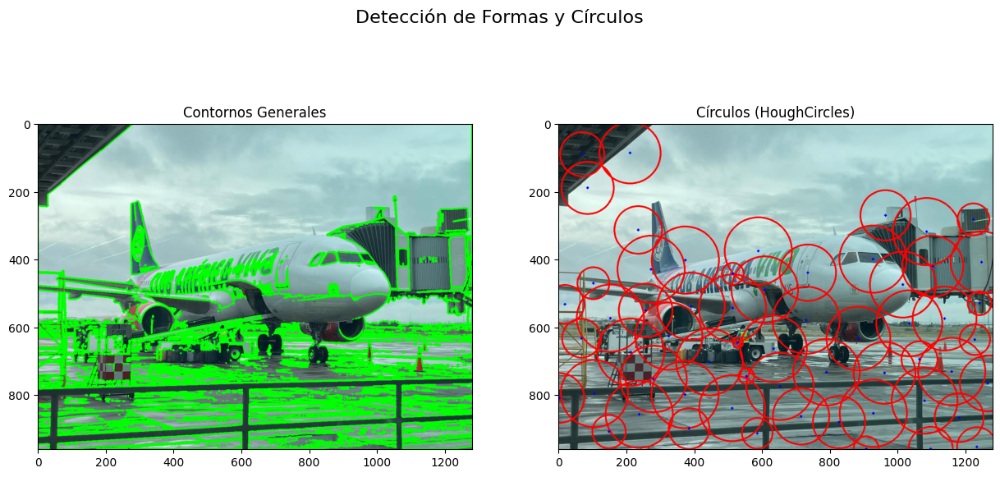

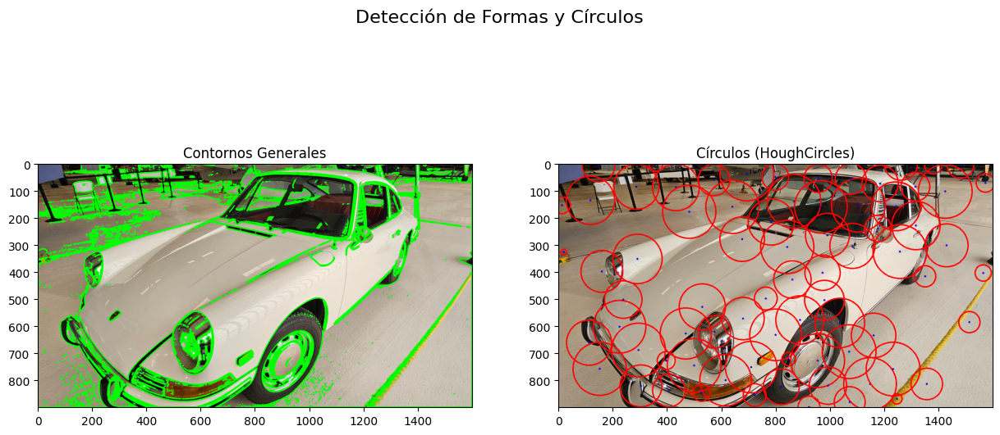

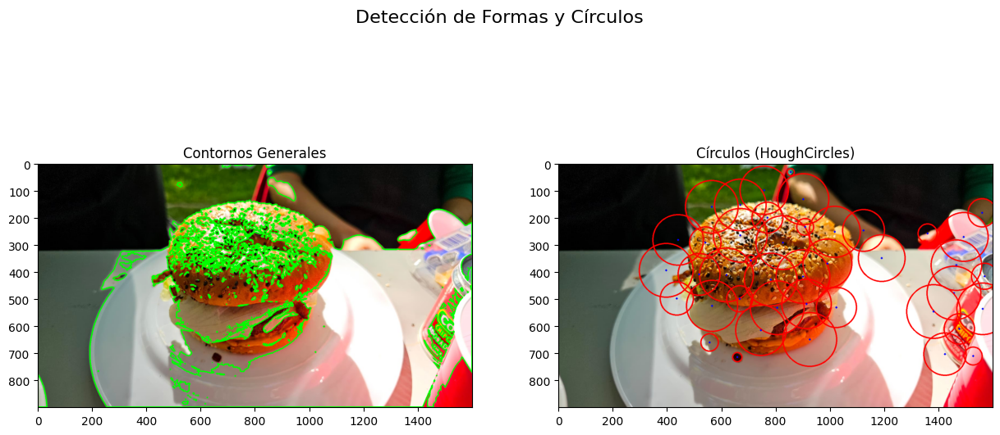

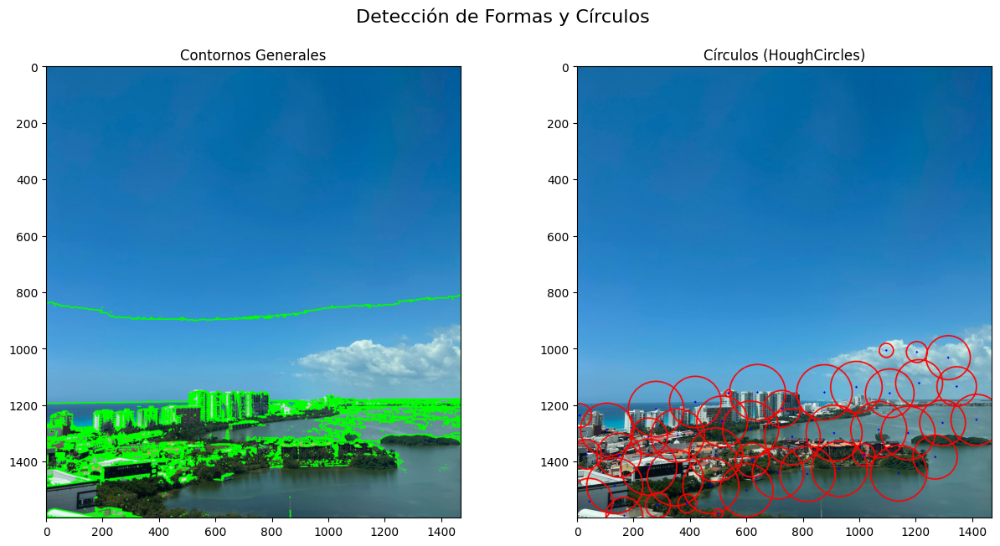

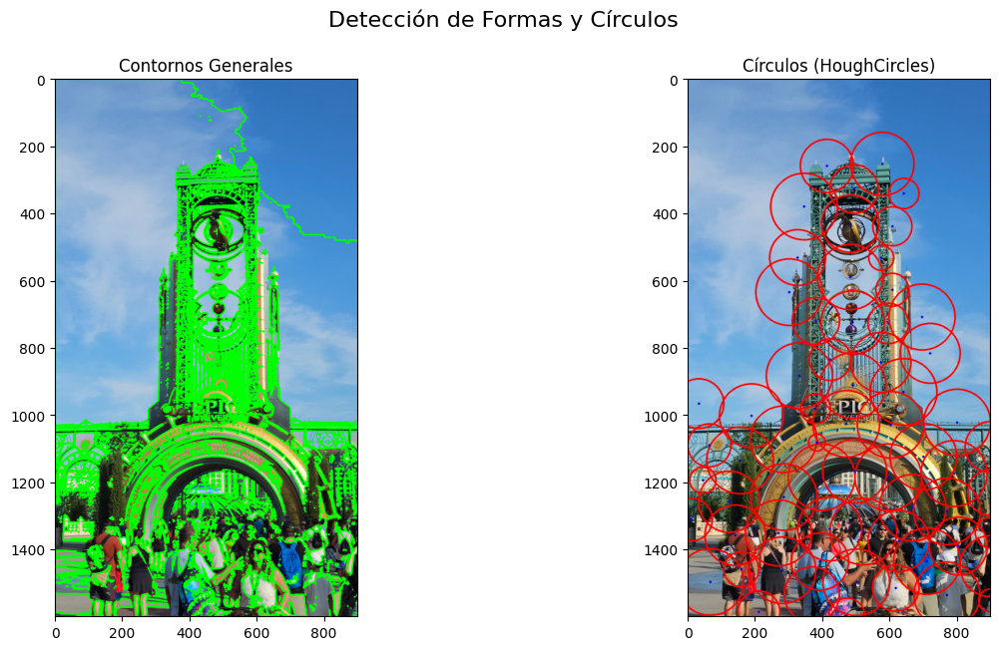

In [11]:
# Detección de formas
avion.formas()
carro.formas()
hamburguesa.formas()
paisaje.formas()
universal.formas()

# Parte 4: Segmentación

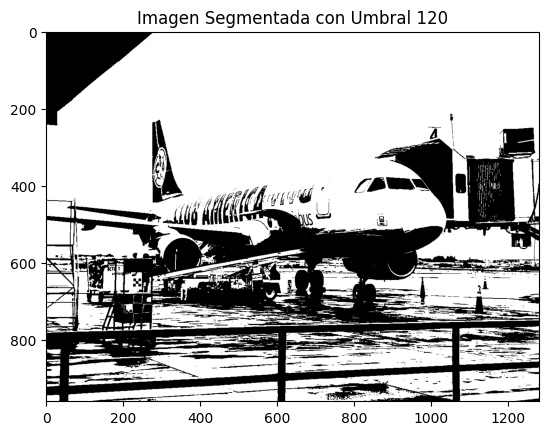

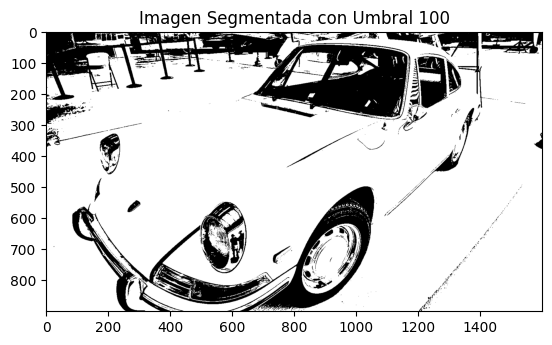

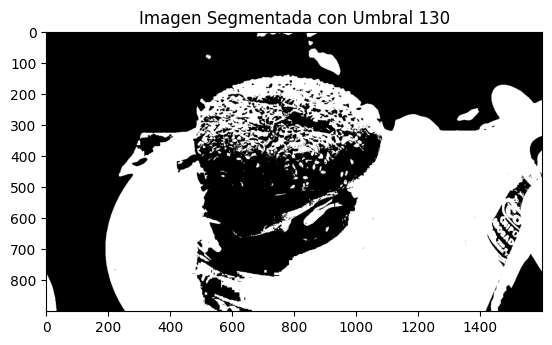

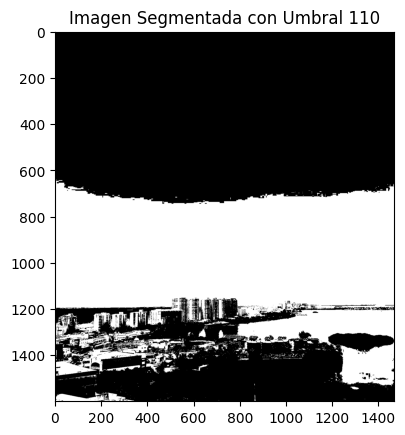

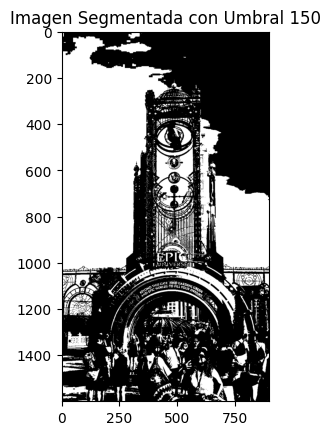

In [13]:
# Segmentar imagenes usando umbralado global
avion.segmentar_umbral(120)
carro.segmentar_umbral(100)
hamburguesa.segmentar_umbral(130)
paisaje.segmentar_umbral(110)
universal.segmentar_umbral(150)

In [ ]:
# Segmentar imagenes usando umbralado adaptativo
avion.segmentar_adaptativo()
carro.segmentar_adaptativo()
hamburguesa.segmentar_adaptativo()
paisaje.segmentar_adaptativo()
universal.segmentar_adaptativo()

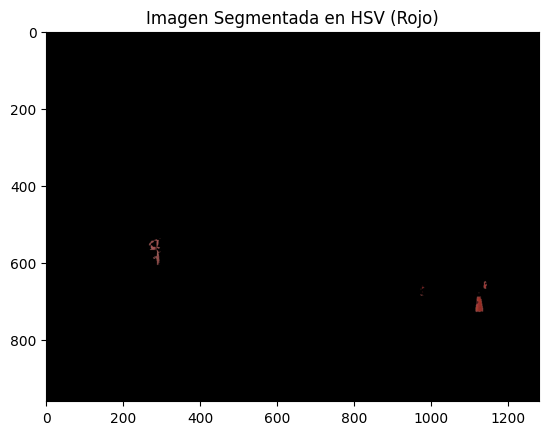

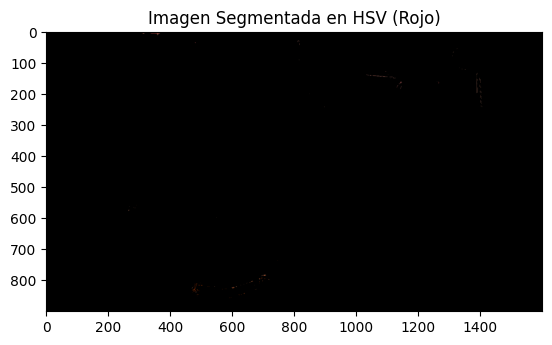

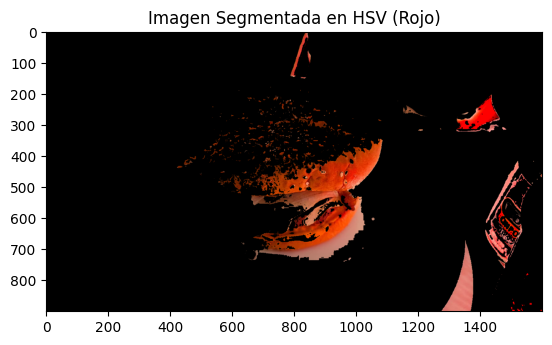

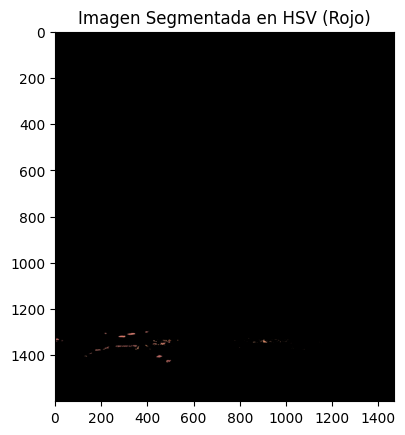

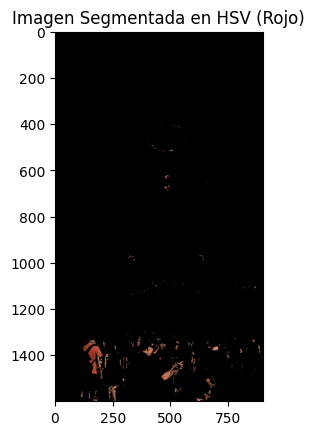

...

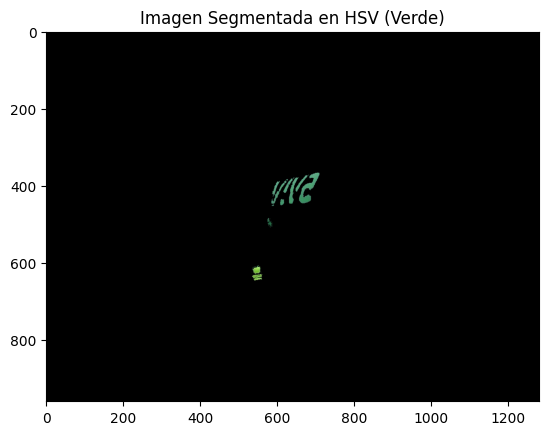

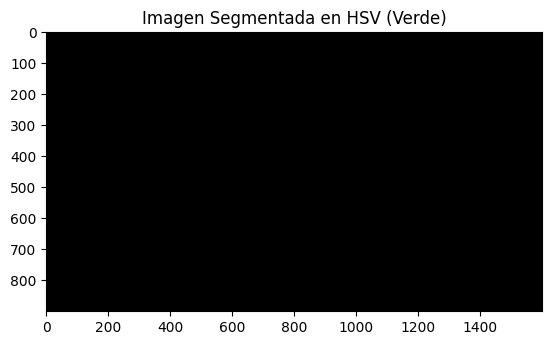

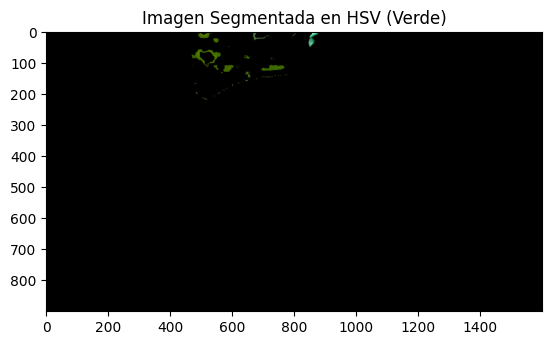

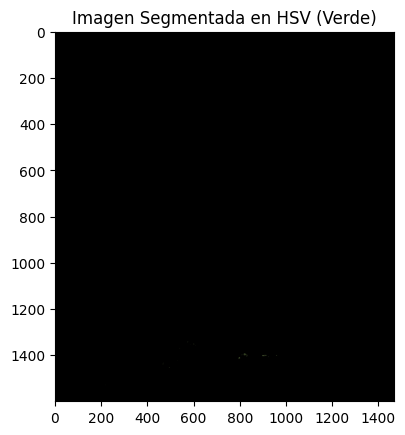

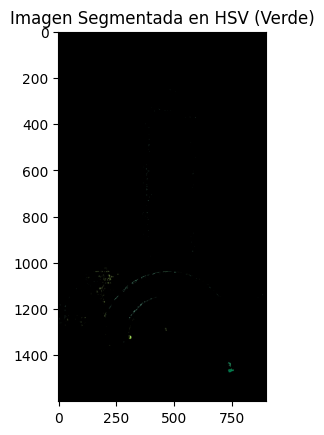

In [ ]:
#Segmentación por color HSV rojo
lower_red = np.array([0, 100, 100])
upper_red = np.array([10, 255, 255])
avion.segmentar_hsv(lower_red, upper_red, "Rojo")
carro.segmentar_hsv(lower_red, upper_red, "Rojo")
hamburguesa.segmentar_hsv(lower_red, upper_red, "Rojo")
paisaje.segmentar_hsv(lower_red, upper_red, "Rojo")
universal.segmentar_hsv(lower_red, upper_red, "Rojo")
# Segmentación por color HSV azul
lower_blue = np.array([100, 100, 100])
upper_blue = np.array([140, 255, 255])
avion.segmentar_hsv(lower_blue, upper_blue, "Azul")
carro.segmentar_hsv(lower_blue, upper_blue, "Azul")
hamburguesa.segmentar_hsv(lower_blue, upper_blue, "Azul")
paisaje.segmentar_hsv(lower_blue, upper_blue, "Azul")
universal.segmentar_hsv(lower_blue, upper_blue, "Azul")

# Segmentación por color HSV verde
lower_green = np.array([40, 100, 100])
upper_green = np.array([80, 255, 255])
avion.segmentar_hsv(lower_green, upper_green, "Verde")
carro.segmentar_hsv(lower_green, upper_green, "Verde")
hamburguesa.segmentar_hsv(lower_green, upper_green, "Verde")
paisaje.segmentar_hsv(lower_green, upper_green, "Verde")
universal.segmentar_hsv(lower_green, upper_green, "Verde")

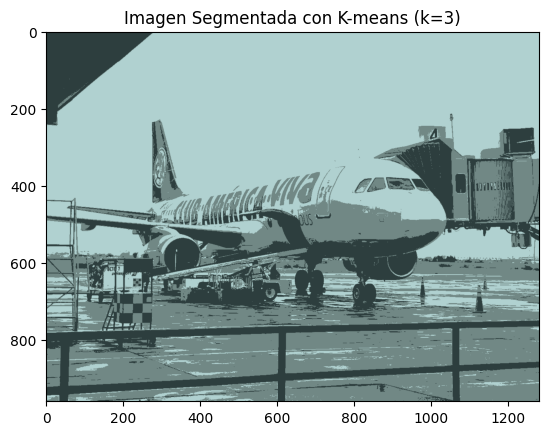

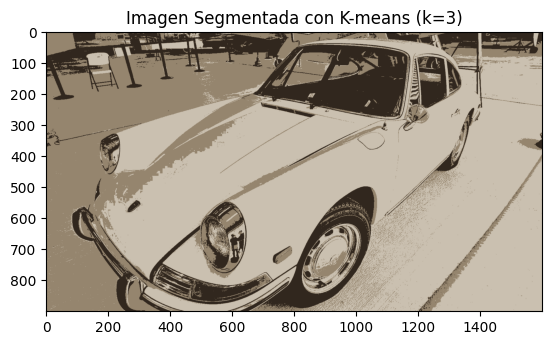

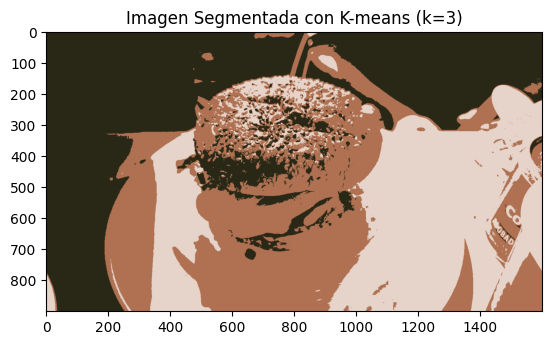

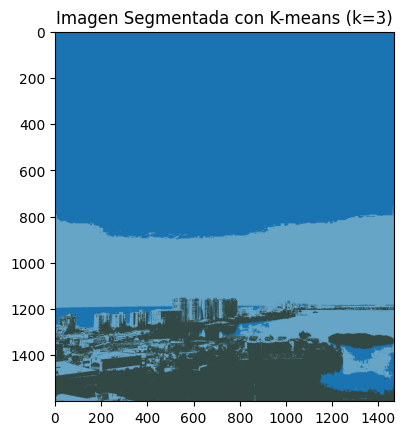

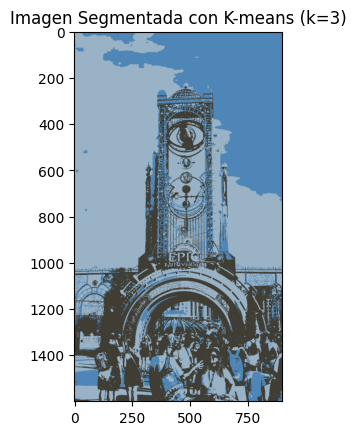

In [ ]:
#Segmentar las imagenes mediante segmentacion K-means clustering
avion.segmentar_kmeans(3)
carro.segmentar_kmeans(3)   
hamburguesa.segmentar_kmeans(3)
paisaje.segmentar_kmeans(3)
universal.segmentar_kmeans(3)